In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt; plt.style.use('ggplot')
import plotly.express as px

In [2]:
pd.set_option('display.max_columns', None)

In [3]:
data = pd.read_csv('/Users/willfitzhugh/Desktop/Coding/Supply-Chain-Analysis/Data/Interim/CleanedData.csv',
                   parse_dates=['OrderDate','ShipDate'])
data.head()

,PaymentType,RealShippingDays,ScheduledShippingDays,OrderProfit,OrderSales,Delivery Status,Late_delivery_risk,ProductCategory,Customer City,Customer Country,Customer Id,Customer Segment,Customer State,ProductDepartment,Latitude,Longitude,Market,Order City,Order Country,OrderDate,Order Id,Order Item Discount,Order Item Discount Rate,Order Item Profit Ratio,Order Item Quantity,Order Region,Order State,Order Status,Product Name,Product Price,ShipDate,Shipping Mode,CustomerName
0,DEBIT,3,4,91.250000,314.640015,Advance shipping,0,Sporting Goods,Caguas,Puerto Rico,20755,Consumer,PR,Fitness,18.251453,-66.037056,Pacific Asia,Bekasi,Indonesia,2018-01-31 22:56:00,77202,13.110000,0.04,0.29,1,Southeast Asia,Java Occidental,COMPLETE,Smart watch,327.75,2018-02-03 22:56:00,Standard Class,Cally Holloway
1,TRANSFER,5,4,-249.089996,311.359985,Late delivery,1,Sporting Goods,Caguas,Puerto Rico,19492,Consumer,PR,Fitness,18.279451,-66.037064,Pacific Asia,Bikaner,India,2018-01-13 12:27:00,75939,16.389999,0.05,-0.80,1,South Asia,Rajastn,PENDING,Smart watch,327.75,2018-01-18 12:27:00,Standard Class,Irene Luna
2,CASH,4,4,-247.779999,309.720001,Shipping on time,0,Sporting Goods,San Jose,EE. UU.,19491,Consumer,CA,Fitness,37.292233,-121.881279,Pacific Asia,Bikaner,India,2018-01-13 12:06:00,75938,18.030001,0.06,-0.80,1,South Asia,Rajastn,CLOSED,Smart watch,327.75,2018-01-17 12:06:00,Standard Class,Gillian Maldonado
3,DEBIT,3,4,22.860001,304.809998,Advance shipping,0,Sporting Goods,Los Angeles,EE. UU.,19490,Home Office,CA,Fitness,34.125946,-118.291016,Pacific Asia,Townsville,Australia,2018-01-13 11:45:00,75937,22.940001,0.07,0.08,1,Oceania,Queensland,COMPLETE,Smart watch,327.75,2018-01-16 11:45:00,Standard Class,Tana Tate
4,PAYMENT,2,4,134.210007,298.250000,Advance shipping,0,Sporting Goods,Caguas,Puerto Rico,19489,Corporate,PR,Fitness,18.253769,-66.037048,Pacific Asia,Townsville,Australia,2018-01-13 11:24:00,75936,29.500000,0.09,0.45,1,Oceania,Queensland,PENDING_PAYMENT,Smart watch,327.75,2018-01-15 11:24:00,Standard Class,Orli Hendricks


In [8]:
''' Map of company store locations.
Raises some concerns about the integrity of the data, as there is an order recorded for Las Vegas in China.
I liekly won't use coordinates in any models, so I think it'll be fine.
'''
fig = px.scatter_geo(data,lat='Latitude',lon='Longitude', hover_name='Customer City')
fig.update_layout(title = 'World map', title_x=0.5)
fig.show()

In [196]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 180519 entries, 0 to 180518
Data columns (total 33 columns):
 #   Column                    Non-Null Count   Dtype         
---  ------                    --------------   -----         
 0   PaymentType               180519 non-null  object        
 1   RealShippingDays          180519 non-null  int64         
 2   ScheduledShippingDays     180519 non-null  int64         
 3   OrderProfit               180519 non-null  float64       
 4   OrderSales                180519 non-null  float64       
 5   Delivery Status           180519 non-null  object        
 6   Late_delivery_risk        180519 non-null  int64         
 7   ProductCategory           180519 non-null  object        
 8   Customer City             180519 non-null  object        
 9   Customer Country          180519 non-null  object        
 10  Customer Id               180519 non-null  int64         
 11  Customer Segment          180519 non-null  object        
 12  Cu

In [197]:
data.describe()

,RealShippingDays,ScheduledShippingDays,OrderProfit,OrderSales,Late_delivery_risk,Customer Id,Latitude,Longitude,Order Id,Order Item Discount,Order Item Discount Rate,Order Item Profit Ratio,Order Item Quantity,Product Price
count,180519.000000,180519.000000,180519.000000,180519.000000,180519.000000,180519.000000,180519.000000,180519.000000,180519.000000,180519.000000,180519.000000,180519.000000,180519.000000,180519.000000
mean,3.497654,2.931847,21.974989,183.107609,0.548291,6691.379495,29.719955,-84.915675,36221.894903,20.664741,0.101668,0.120647,2.127638,141.232550
std,1.623722,1.374449,104.433526,120.043670,0.497664,4162.918106,9.813646,21.433241,21045.379569,21.800901,0.070415,0.466796,1.453451,139.732492
min,0.000000,0.000000,-4274.979980,7.490000,0.000000,1.000000,-33.937553,-158.025986,1.000000,0.000000,0.000000,-2.750000,1.000000,9.990000
25%,2.000000,2.000000,7.000000,104.379997,0.000000,3258.500000,18.265432,-98.446312,18057.000000,5.400000,0.040000,0.080000,1.000000,50.000000
50%,3.000000,4.000000,31.520000,163.990005,1.000000,6457.000000,33.144863,-76.847908,36140.000000,14.000000,0.100000,0.270000,1.000000,59.990002
75%,5.000000,4.000000,64.800003,247.399994,1.000000,9779.000000,39.279617,-66.370583,54144.000000,29.990000,0.160000,0.360000,3.000000,199.990005
max,6.000000,4.000000,911.799988,1939.989990,1.000000,20757.000000,48.781933,115.263077,77204.000000,500.000000,0.250000,0.500000,5.000000,1999.989990


In [198]:
datemax = data.OrderDate.dt.date.max()
datemin = data.OrderDate.dt.date.min()
print('First Date Recorded: '+ str(datemin) +'\nLast Date Recorded: '+ str(datemax))

First Date Recorded: 2015-01-01
Last Date Recorded: 2018-01-31


In [199]:
#highlight some important catagorical variables
important_cat_cols = data[['PaymentType','ProductDepartment','Customer Segment','Market','Delivery Status',
                           'Order Status','Shipping Mode']]
for i in important_cat_cols.columns:
    print(i + ':            ', list(np.unique(data[[i]])),'\n' )

PaymentType:             ['CASH', 'DEBIT', 'PAYMENT', 'TRANSFER'] 

ProductDepartment:             ['Apparel', 'Book Shop', 'Discs Shop', 'Fan Shop', 'Fitness', 'Footwear', 'Golf', 'Health and Beauty ', 'Outdoors', 'Pet Shop', 'Technology'] 

Customer Segment:             ['Consumer', 'Corporate', 'Home Office'] 

Market:             ['Africa', 'Europe', 'LATAM', 'Pacific Asia', 'USCA'] 

Delivery Status:             ['Advance shipping', 'Late delivery', 'Shipping canceled', 'Shipping on time'] 

Order Status:             ['CANCELED', 'CLOSED', 'COMPLETE', 'ON_HOLD', 'PAYMENT_REVIEW', 'PENDING', 'PENDING_PAYMENT', 'PROCESSING', 'SUSPECTED_FRAUD'] 

Shipping Mode:             ['First Class', 'Same Day', 'Second Class', 'Standard Class'] 



---
## Explore factors influencing fraud orders:

In [200]:
data['IsFraud'] = ( data['Order Status'] == 'SUSPECTED_FRAUD' )

fraud_perc = data['IsFraud'].mean()
print("Percentage of orders marked as fraud:", np.round(fraud_perc,4)*100, '%')
print("Number of fraud orders:", data.IsFraud.sum())

Percentage of orders marked as fraud: 2.25 %
Number of fraud orders: 4062


In [201]:
def groupby_fraud_perc(col):
    return data.groupby(col).mean()[['IsFraud']].reset_index().sort_values('IsFraud', ascending=False)

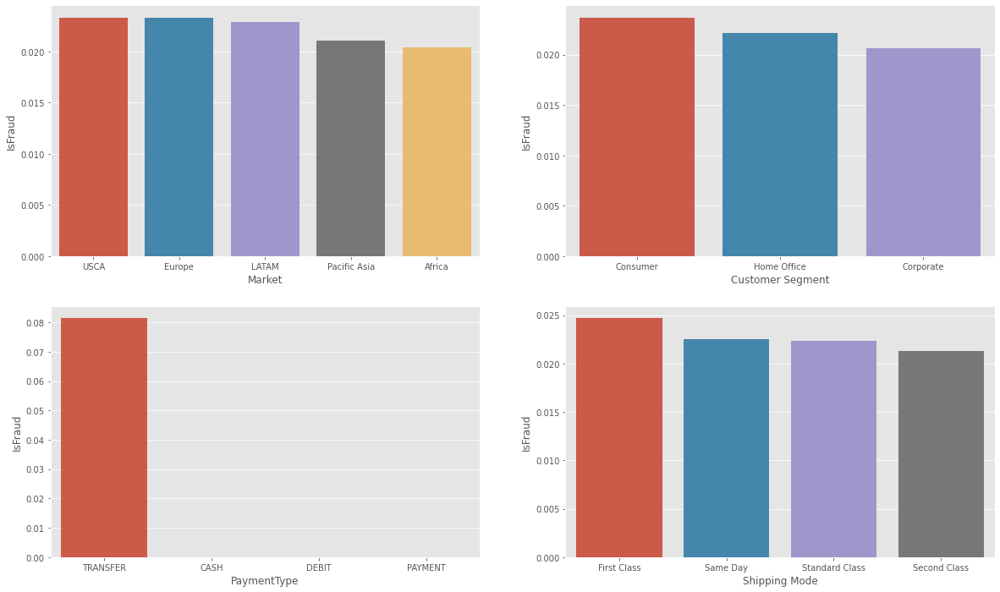

In [202]:
num_rows = 2
num_cols = 2
fig, axes = plt.subplots(num_rows, num_cols, figsize = (20, 12))

plot_cols = ['Market','Customer Segment','PaymentType','Shipping Mode']
k=0
for row in range(num_rows):
    for col in range(num_cols):
        
        sns.barplot(ax=axes[row,col], data=groupby_fraud_perc(plot_cols[k]),x=plot_cols[k], y='IsFraud',
                    dodge = False).legend([],[], frameon=False)
        k+=1


- While there are slight trends in fraud frequency in the Market, Customer Segment and Shipping Mode variables, the most clear indicator for fraud potential is PaymentType, as 100% of fraud occurs on orders paid for by transfer. 

In [203]:
groupby_fraud_perc('ProductCategory')

,ProductCategory,IsFraud
4,Basketball,0.044776
49,Women's Golf Clubs,0.044199
31,Kids' Golf Clubs,0.033854
40,Sporting Goods,0.033613
16,DVDs,0.033126
27,Health and Beauty,0.030387
21,Girls' Apparel,0.029142
2,Baby,0.028986
6,Boxing & MMA,0.028369
44,Trade-In,0.027721


In [204]:
groupby_fraud_perc('Product Name')

,Product Name,IsFraud
29,Garmin Approach S4 Golf GPS Watch,0.083333
73,Polar Loop Activity Tracker,0.074074
20,Diamondback Girls' Clarity 24 Hybrid Bike 201,0.071429
47,MDGolf Pittsburgh Penguins Putter,0.056604
92,The North Face Women's Recon Backpack,0.052632
...,...,...
45,LIJA Women's Mid-Length Panel Golf Shorts,0.000000
36,GoPro HERO3+ Black Edition Camera,0.000000
100,Total Gym 1400,0.000000
93,Titleist Club Glove Travel Cover,0.000000


- There are certainly some products and product categories which attract more fraud, but they don't seem to depend on product pricing.

In [205]:
#check if numerical columns have any correlation to fraud:
data.corr()[['IsFraud']].sort_values('IsFraud')
'''
The only thing possibly significant here is that Late_delivery_risk has a decently negative correlation to fraud,
which might suggest that scammers go after orders which might be delivered before the company notices there is
potential for fraud.
'''

'\nThe only thing possibly significant here is that Late_delivery_risk has a decently negative correlation to fraud,\nwhich might suggest that scammers go after orders which might be delivered before the company notices there is\npotential for fraud.\n'

In [206]:
'''
I thought it might be interesting to see if orders which were placed in one country and set to be delivered in
another country had a higher percentage of fraud. Turns out, every order in this dataset fits this description,
so this variable is useless.
'''
data['DifferentCountry'] = (data['Customer Country'] != data['Order Country'])
print(groupby_fraud_perc('DifferentCountry'))
data = data.drop(columns = ['DifferentCountry'])

   DifferentCountry   IsFraud
0              True  0.022502


In [207]:
#further explore if there is a geographic link to fraud
groupby_fraud_perc('Order Country')

,Order Country,IsFraud
50,Etiopa,0.200000
61,Guinea,0.133333
67,Hong Kong,0.123288
135,Siria,0.111111
95,Martinica,0.100000
...,...,...
1,Albania,0.000000
81,Kirguistn,0.000000
78,Jordania,0.000000
68,Hungra,0.000000


In [208]:
groupby_fraud_perc('Order State')

,Order State,IsFraud
666,Meta,1.0
441,Hunedoara,1.0
521,Kastamonu,1.0
542,Kindia,1.0
52,Ar Raqa,1.0
...,...,...
467,Ivanovo,0.0
469,Jaiber Pajtunju,0.0
477,Jeju,0.0
478,Jersn,0.0


In [209]:
groupby_fraud_perc('Order City')

,Order City,IsFraud
1633,Kindia,1.0
2969,Siping,1.0
3365,Villavicencio,1.0
2837,San Severo,1.0
149,Ar Raqa,1.0
...,...,...
1374,Homestead,0.0
1375,Homs,0.0
1376,Hoover,0.0
1377,Horlivka,0.0


- Clearly, this company should not accept orders from certain cities. Some countries have a higher rate of fraud (1 in 5 order from Ethiopia is fraud), but, in certain cities and states, every order is fraud. To be fair, there are not many orders coming from these cities, so this info won't prevent a great portion of fruad.

In [210]:
fraud_cities = groupby_fraud_perc('Order City').query(' IsFraud == 1')['Order City'].values

for i in fraud_cities:
    num_orders = len( data.loc[ data['Order City'] == i ] )
    print('Number of fraud orders from ' + i +':', num_orders)

Number of fraud orders from Kindia: 6
Number of fraud orders from Siping: 1
Number of fraud orders from Villavicencio: 4
Number of fraud orders from San Severo: 3
Number of fraud orders from Ar Raqa: 2
Number of fraud orders from Cubuk: 4
Number of fraud orders from Kastamonu: 2
Number of fraud orders from Deva: 3


In [211]:
groupby_fraud_perc('Customer City')

,Customer City,IsFraud
395,Pittsburg,0.152542
156,Ewa Beach,0.146552
537,West Jordan,0.133803
46,Blacksburg,0.112903
263,Lansdale,0.108911
...,...,...
271,Levittown,0.000000
270,Lenoir,0.000000
269,Lawton,0.000000
268,Lawrenceville,0.000000


- Apparently, while the destination of the order has a clear influence fraud, the location at which the order was placed influences fraud, as well. The store location in Pittsburg has a fraud percentage nearly 7 times greater than the company average.

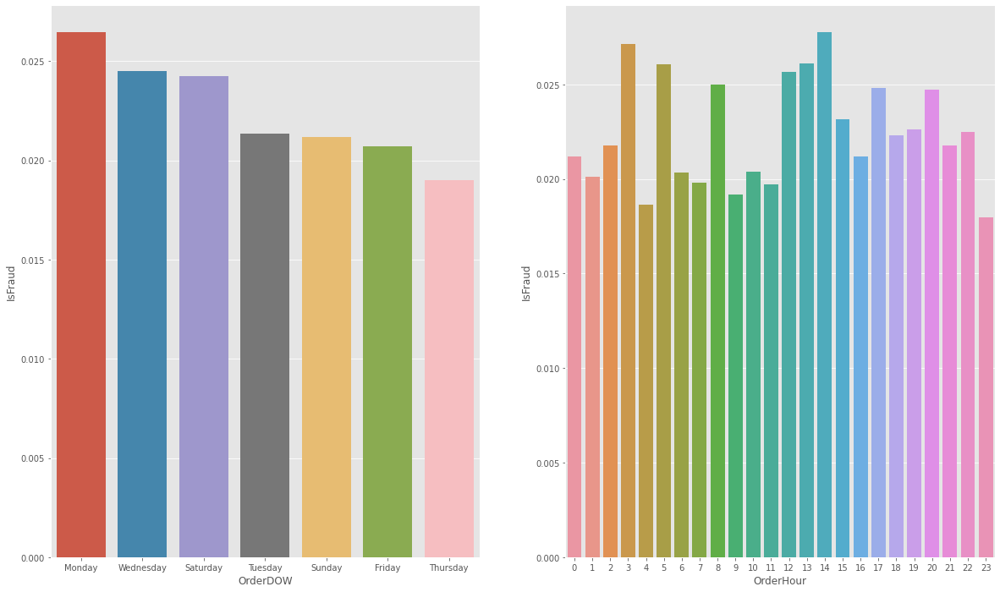

In [212]:
#explore a temporal link to fraud
data['OrderDOW'] = data['OrderDate'].dt.day_name()
data['OrderHour'] = data['OrderDate'].dt.hour

fig, axes = plt.subplots(1, 2, figsize = (20, 12))

plot_cols = ['OrderDOW','OrderHour']
k=0
for col in range(2):

    sns.barplot(ax=axes[col], data=groupby_fraud_perc(plot_cols[k]),x=plot_cols[k], 
                y='IsFraud', dodge = False).legend([],[], frameon=False)
    k+=1

- We can see that fraud occurs least frequently on Thursdays and most frequently on Mondays (1.90% vs 2.65%, roughly a 40% increase is fraud frequency).
- There is a similar difference in fraud frequency between the worst and best hours during which an order is placed. However, there is no clear window during which excessive amount of fraud occur, except maybe between noon and 3pm.

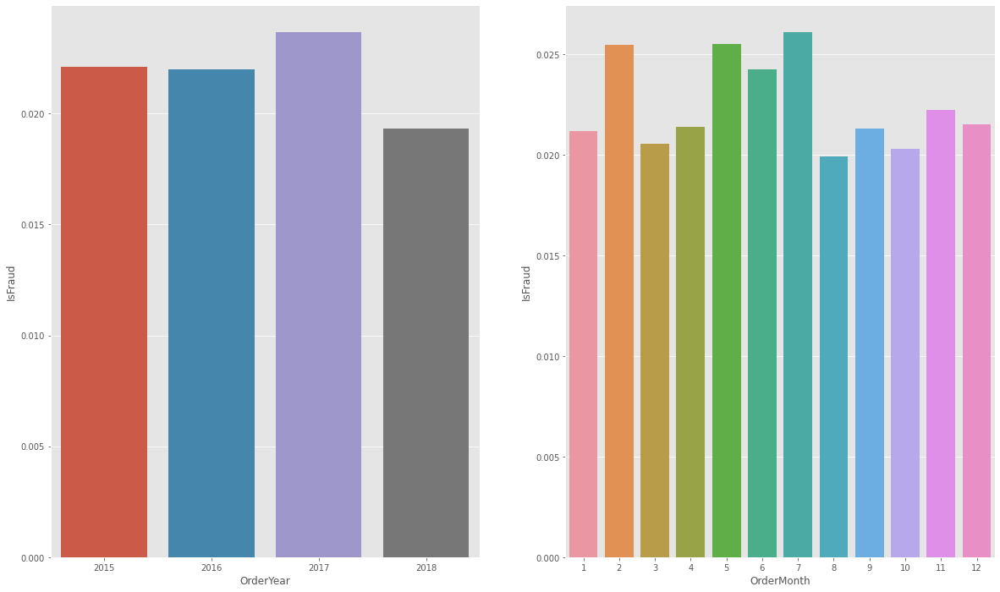

In [213]:
data['OrderMonth'] = data['OrderDate'].dt.month
data['OrderYear'] = data['OrderDate'].dt.year

fig, axes = plt.subplots(1, 2, figsize = (20, 12))

plot_cols = ['OrderYear','OrderMonth']
k=0
for col in range(2):

    sns.barplot(ax=axes[col], data=groupby_fraud_perc(plot_cols[k]),x=plot_cols[k], 
                y='IsFraud', dodge = False).legend([],[], frameon=False)
    k+=1

- Here we can see that there is some variation in fraud frequency among months, but not a significant trend through the years.
---

In [215]:
data.to_csv('/Users/willfitzhugh/Desktop/Coding/Supply-Chain-Analysis/Data/Interim/Ready_For_Fraud_Featuers.csv',
           index=False)